Problem Definition
During development, motor neurons change rapidly as embryonic time progresses. At the molecular level, those changes should be reflected in each cell’s gene expression profile. Our goal is to test whether embryonic age is actually detectable as a structure in high-dimensional single-cell RNA-seq data from motor neurons.

The input to our system is a set of preprocessed .h5ad files, one per embryonic age (e09, e10, e12, e13, e14). Each file contains:

A gene expression matrix (cells × genes) for motor neuron–enriched samples at that age
Cell-level metadata including the embryonic age
We combine these files into a single AnnData object where each row is a cell and each column is a gene, and we add an embryonic_age label to each cell. The core question is:

Do cells from different embryonic ages occupy distinct regions of gene expression space, or are they intermixed?

To answer this, our system performs a full exploratory and statistical analysis:

Quality and composition check. We verify that the combined dataset is balanced enough across ages and inspect basic properties like the number of cells per age.
Dimensionality reduction. We apply Principal Component Analysis (PCA) followed by UMAP to compress thousands of genes into a 2D embedding. We color points by embryonic age to see if ages form clusters or gradients.
Quantitative separation metrics. Beyond eyeballing plots, we compute a silhouette score that measures how well embryonic ages are separated in the UMAP space.
Differential gene expression (DGE). We identify genes that are significantly up- or down-regulated at each embryonic age compared to the others. These “marker” genes highlight which molecular programs distinguish early from late stages.
Marker visualization. We visualize top age-specific genes using heatmaps, dotplots, and UMAP overlays to see how their expression patterns track the spatial structure of the embedding.
The outputs of the system are therefore:

PCA and UMAP plots colored by embryonic age
A numerical silhouette score measuring age separation
Ranked lists of age-specific marker genes from DGE
Marker gene heatmaps, dotplots, and UMAP expression overlays
If embryonic age is truly encoded in the gene expression profiles, we expect to see (i) clear age-structured patterns in PCA/UMAP space and (ii) coherent sets of genes whose expression changes systematically with age. If we instead find no meaningful clustering or only weak DGE, that would suggest embryonic age is not strongly separable in this dataset or that other factors (batch, technical noise, subtypes) dominate the structure.

In [2]:
!pip install scanpy anndata scipy

ERROR: Could not find a version that satisfies the requirement glob (from versions: none)
ERROR: No matching distribution found for glob


In [6]:
import os
import glob
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

data_dir = "rna_data"
file_paths = sorted(glob.glob(os.path.join(data_dir, "*_integrated.h5ad")))

adatas = []
for path in file_paths:
    print(path)
    age_label = os.path.basename(path).split("_")[0]
    tmp = sc.read_h5ad(path)
    tmp.obs["embryonic_age"] = age_label
    adatas.append(tmp)

adata = ad.concat(adatas, join="outer")
adata.obs_names_make_unique()
adata.obs["embryonic_age"] = adata.obs["embryonic_age"].astype("category")
adata

rna_data/e09_integrated.h5ad
rna_data/e10_integrated.h5ad
rna_data/e11_integrated.h5ad
rna_data/e12_integrated.h5ad
rna_data/e13_integrated.h5ad
rna_data/e14_integrated.h5ad


AnnData object with n_obs × n_vars = 99989 × 29184
    obs: 'age', '10X', 'sample_type', 'Sequencer', 'Flowcell', 'Collection', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'leiden', 'doublets', 'predicted_labels', 'majority_voting', 'conf_score', 'celltypes', 'over_clustering', 'batch_id', 'embryonic_age'
    obsm: 'X_pca', 'X_scanorama', 'X_umap'
    layers: 'counts'

AnnData object with n_obs × n_vars = 99989 × 29184
    obs: 'age', '10X', 'sample_type', 'Sequencer', 'Flowcell', 'Collection', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'leiden', 'doublets', 'predicted_labels', 'majority_voting', 'conf_score', 'celltypes', 'over_clustering', 'batch_id', 'embryonic_age'
    obsm: 'X_pca', 'X_scanorama', 'X_umap'
    layers: 'counts'
embryonic_age
e09    20821
e10    29409
e11    22702
e12    10031
e13    12868
e14     4158
Name: count, dtype: int64


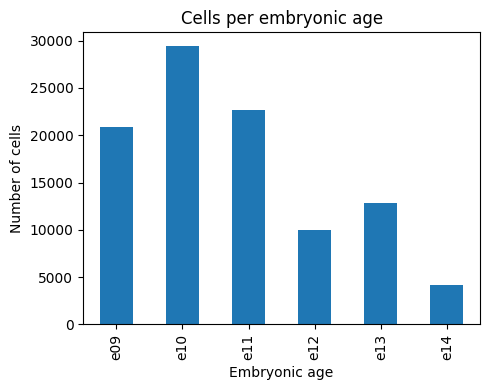

In [7]:
print(adata)

age_counts = adata.obs["embryonic_age"].value_counts().sort_index()
print(age_counts)

plt.figure(figsize=(5, 4))
age_counts.plot(kind="bar")
plt.xlabel("Embryonic age")
plt.ylabel("Number of cells")
plt.title("Cells per embryonic age")
plt.tight_layout()
plt.show()

In [9]:
!pip install --user scikit-misc

python3.11(1723) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [10]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata

sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat_v3")
adata = adata[:, adata.var["highly_variable"]]

sc.pp.scale(adata, max_value=10)
adata

/opt/miniconda3/envs/project_env/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)
/opt/miniconda3/envs/project_env/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/opt/miniconda3/envs/project_env/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


AnnData object with n_obs × n_vars = 99989 × 2000
    obs: 'age', '10X', 'sample_type', 'Sequencer', 'Flowcell', 'Collection', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'batch', 'leiden', 'doublets', 'predicted_labels', 'majority_voting', 'conf_score', 'celltypes', 'over_clustering', 'batch_id', 'embryonic_age'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'
    obsm: 'X_pca', 'X_scanorama', 'X_umap'
    layers: 'counts'

python3.11(1729) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


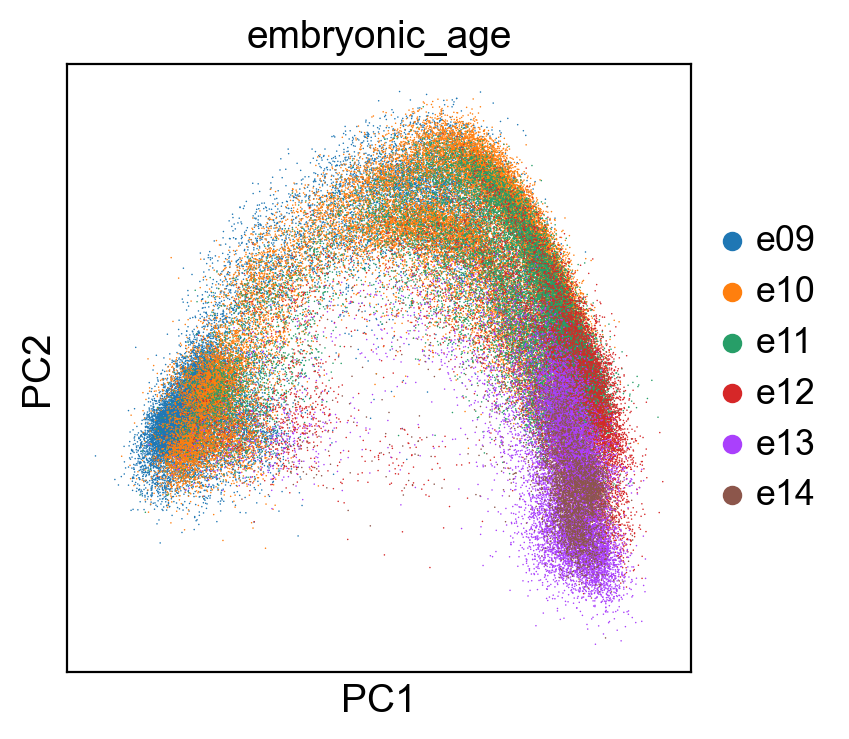

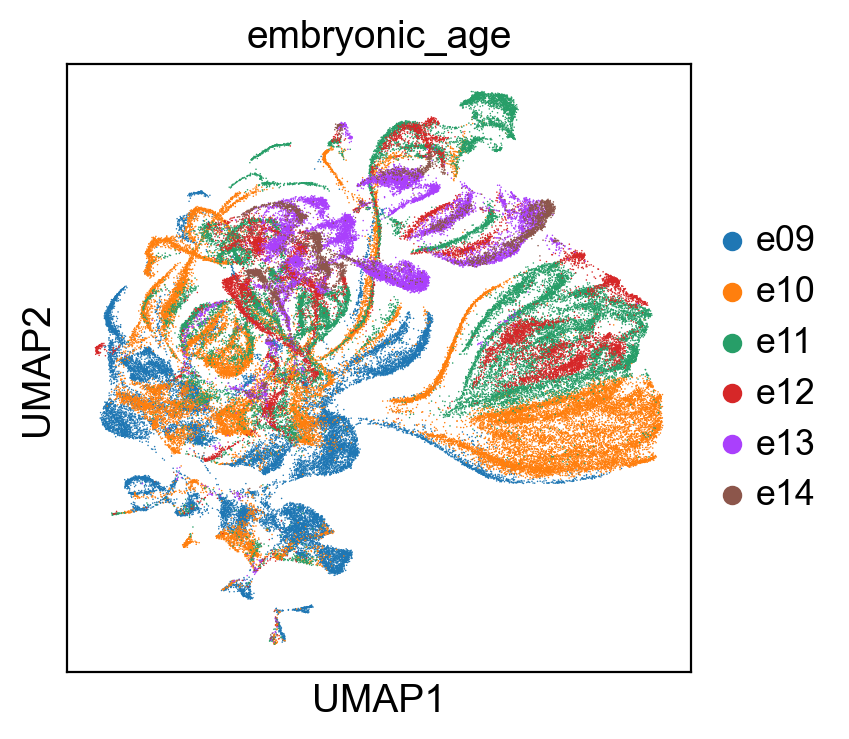

In [11]:
sc.set_figure_params(dpi=100)

sc.tl.pca(adata, svd_solver="arpack")
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=40)
sc.tl.umap(adata)

sc.pl.pca(adata, color="embryonic_age")
sc.pl.umap(adata, color="embryonic_age")

In [12]:
from sklearn.metrics import silhouette_score

embedding = adata.obsm["X_umap"]
labels = adata.obs["embryonic_age"].cat.codes.values

silhouette = silhouette_score(embedding, labels)
print("Silhouette score for embryonic age on UMAP embedding:", silhouette)

Silhouette score for embryonic age on UMAP embedding: -0.051629580557346344


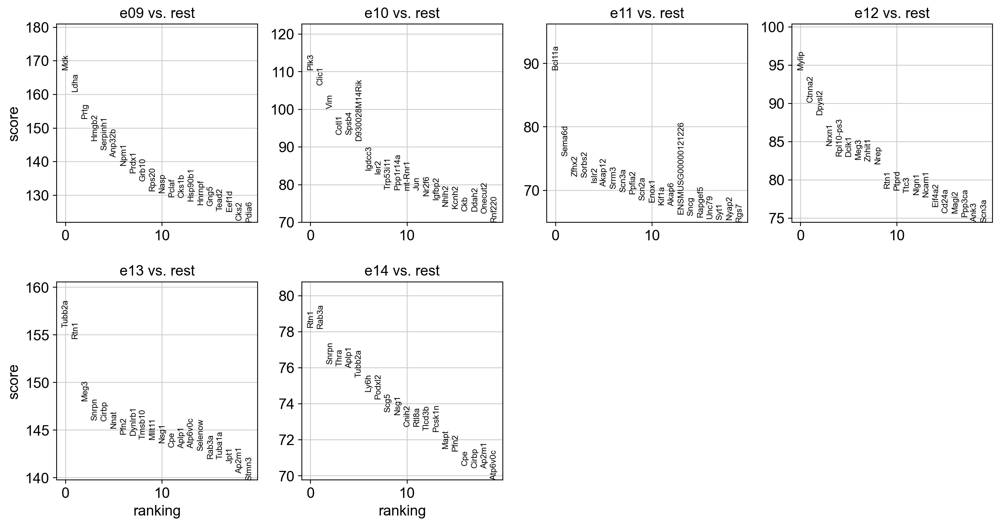

In [13]:
sc.tl.rank_genes_groups(
    adata,
    groupby="embryonic_age",
    method="wilcoxon",
    n_genes=50
)

sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)

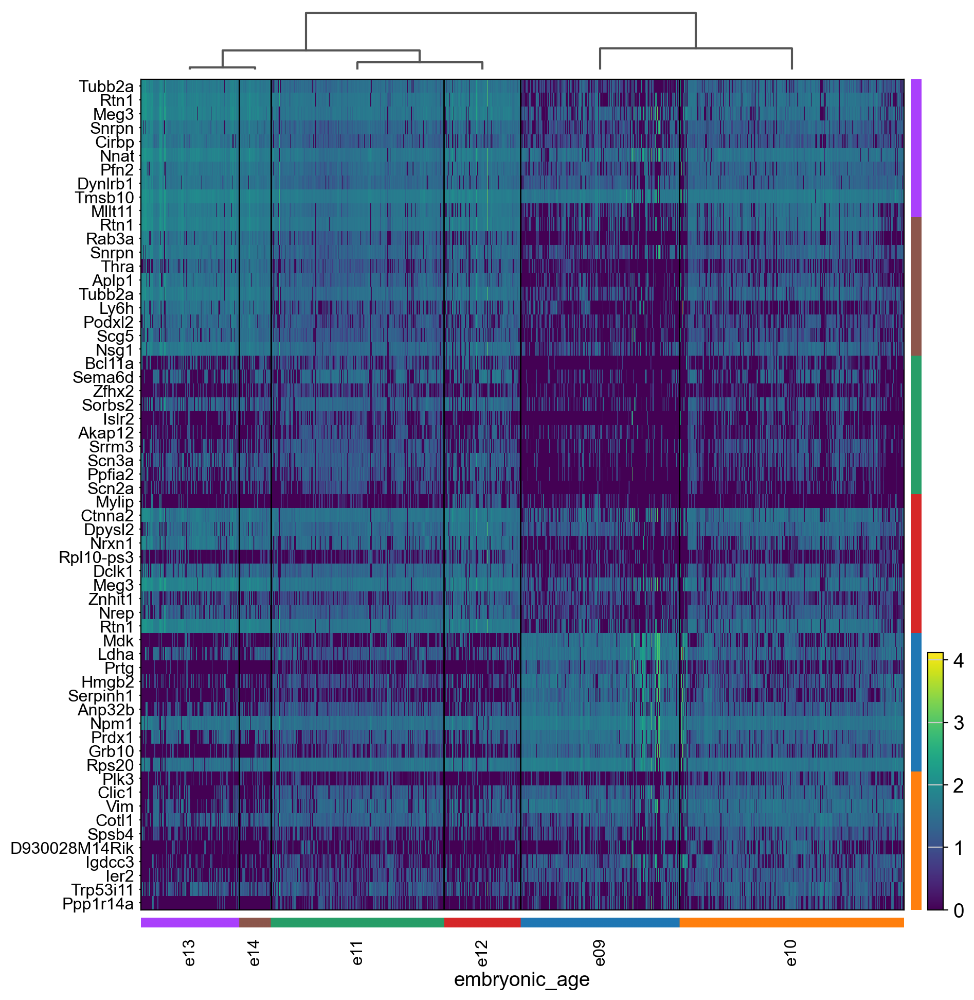

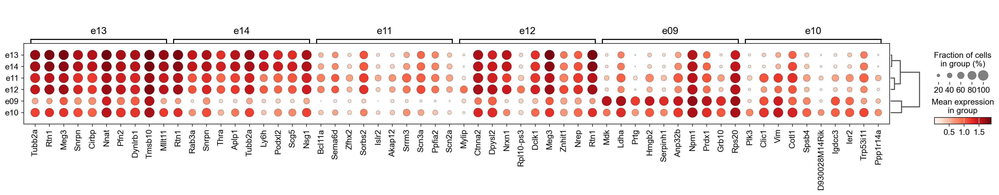

In [14]:
sc.pl.rank_genes_groups_heatmap(
    adata,
    n_genes=10,
    groupby="embryonic_age",
    show_gene_labels=True,
    swap_axes=True
)

sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=10,
    groupby="embryonic_age"
)

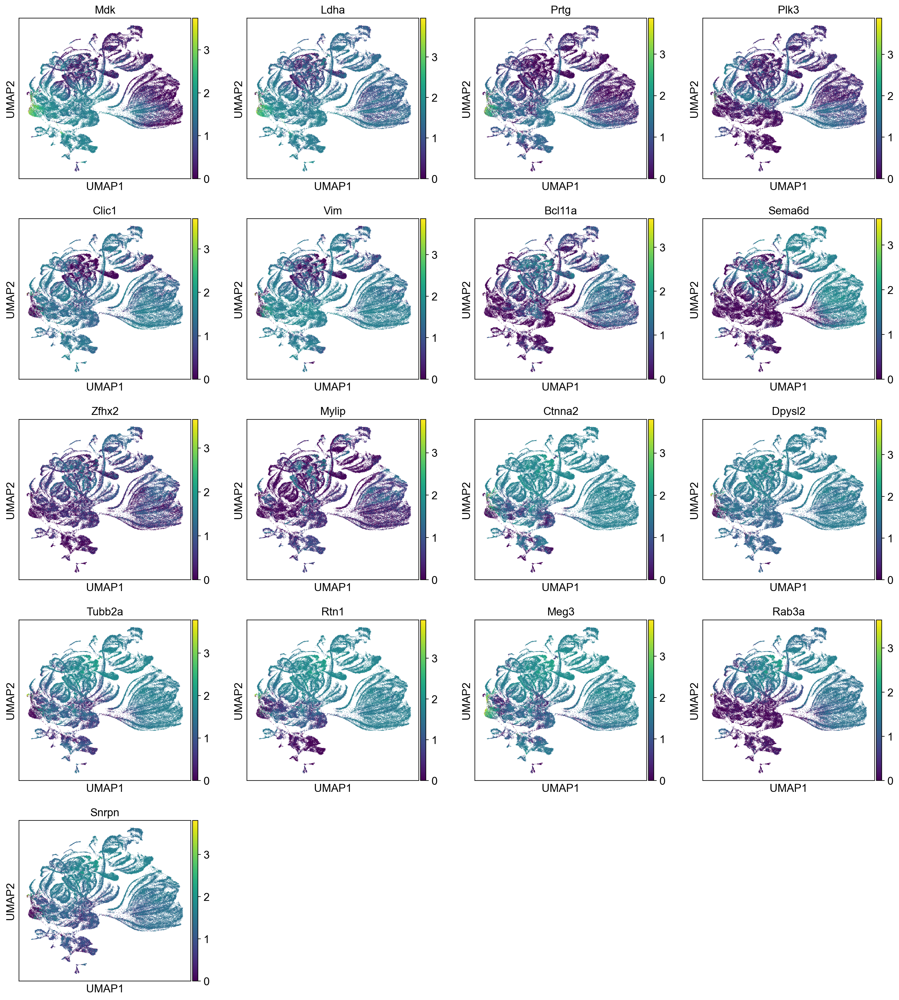

In [15]:
result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names

top_genes = []
for g in groups:
    top_genes.extend(list(result["names"][g][:3]))

top_genes = list(dict.fromkeys(top_genes))

sc.pl.umap(
    adata,
    color=top_genes,
    ncols=4
)

In [21]:
import numpy as np
from sklearn.neighbors import NearestNeighbors

X = adata.obsm["X_umap"]
ages = adata.obs["embryonic_age"].astype(str).values

states = np.unique(ages)
n_states = len(states)

state_to_idx = {s: i for i, s in enumerate(states)}
idx_to_state = {i: s for s, i in state_to_idx.items()}

k = 25
nbrs = NearestNeighbors(n_neighbors=k + 1, algorithm="auto").fit(X)
distances, neighbor_indices = nbrs.kneighbors(X)

neighbor_indices = neighbor_indices[:, 1:]

T_counts = np.zeros((n_states, n_states), dtype=float)

for i, neighs in enumerate(neighbor_indices):
    from_age = ages[i]
    from_idx = state_to_idx[from_age]

    for j in neighs:
        to_age = ages[j]
        to_idx = state_to_idx[to_age]
        T_counts[from_idx, to_idx] += 1

T = T_counts / T_counts.sum(axis=1, keepdims=True)

print("States in order:", states)
print("Transition matrix (rows = from, columns = to):")
np.set_printoptions(precision=3, suppress=True)
print(T)

States in order: ['e09' 'e10' 'e11' 'e12' 'e13' 'e14']
Transition matrix (rows = from, columns = to):
[[0.853 0.117 0.018 0.006 0.005 0.001]
 [0.08  0.83  0.071 0.009 0.008 0.002]
 [0.017 0.096 0.763 0.105 0.014 0.005]
 [0.012 0.029 0.242 0.638 0.054 0.024]
 [0.008 0.017 0.027 0.042 0.794 0.112]
 [0.007 0.014 0.032 0.06  0.349 0.538]]


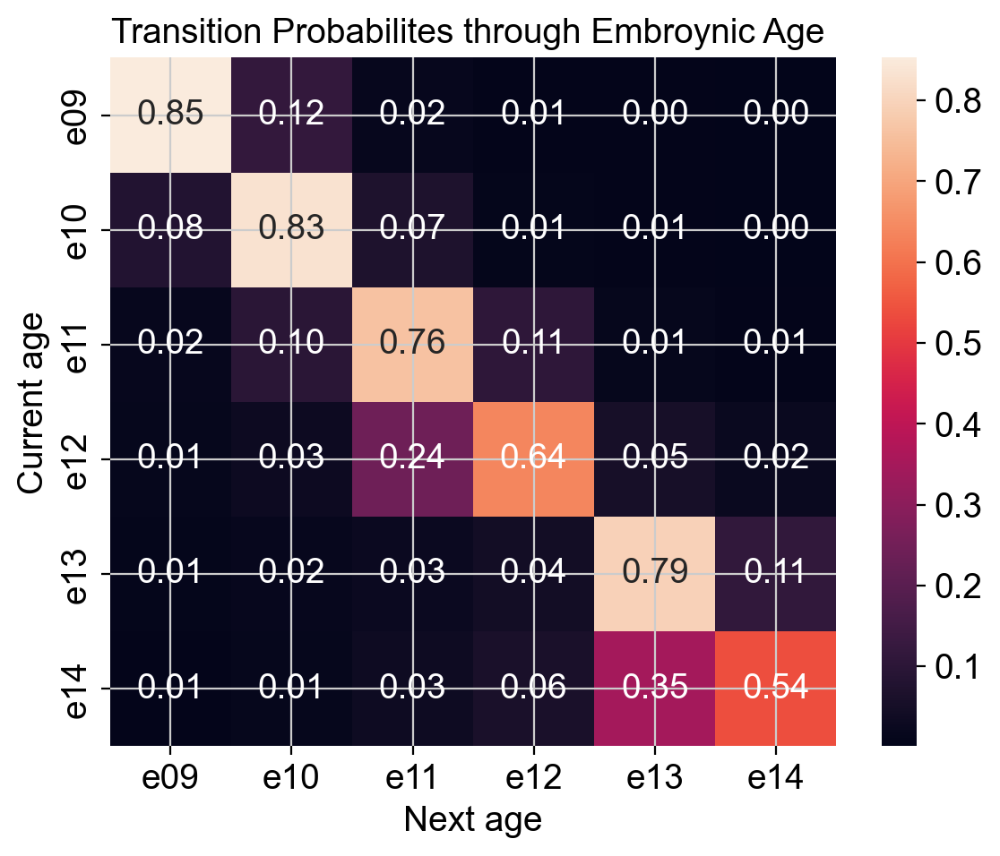

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6,5))
sns.heatmap(
    T,
    annot=True,
    fmt=".2f",
    xticklabels=states,
    yticklabels=states
)
plt.xlabel("Next age")
plt.ylabel("Current age")
plt.title("Transition Probabilites through Embroynic Age ")
plt.tight_layout()
plt.show()

In [30]:
rng = np.random.default_rng(0)

def simulate_markov_chain(T, states, start_state, n_steps=10):
    seq = [start_state]
    current = start_state

    for _ in range(n_steps):
        i = state_to_idx[current]
        probs = T[i]
        next_idx = rng.choice(len(states), p=probs)
        current = states[next_idx]
        seq.append(current)

    return seq

path = simulate_markov_chain(T, states, start_state="e09", n_steps=40)
print("Simulated developmental path:", " -> ".join(path))

Simulated developmental path: e09 -> e09 -> e09 -> e09 -> e09 -> e09 -> e10 -> e10 -> e10 -> e10 -> e11 -> e11 -> e09 -> e10 -> e09 -> e09 -> e09 -> e10 -> e10 -> e10 -> e10 -> e09 -> e09 -> e09 -> e09 -> e09 -> e09 -> e13 -> e14 -> e14 -> e14 -> e14 -> e13 -> e13 -> e13 -> e13 -> e13 -> e13 -> e14 -> e14 -> e13
